In [1]:
from s04utils.modules.load.Timestamps import Timestamps
from s04utils.modules.load.BinnedTimestamps import BinnedTimestamps
from s04utils.modules.analyze import HMM_analysis as hmma

from bokeh.plotting import figure, show, output_notebook, curdoc
from matplotlib_inline.backend_inline import set_matplotlib_formats

import pandas as pd 
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

import os
import glob


from sfHMM import sfHMM1
from sfHMM.gmm import GMMs


In [2]:
# Set quality for plt plots
set_matplotlib_formats('retina')

# Set output style for bokeh plots
#curdoc().theme = 'dark_minimal'
output_notebook()

Loading BokehJS ...

In [3]:
SOURCE_PATH = '/Users/kappel/Messungen/Setup04/JaKa/post_hack/23_08_29/77K-33nM-eGFP-vitrified/10uW/timestamps/tt_eGFP_33nM_NaP_100mM_ph7dot5_Treh7dot5_10uW_77K_circpol_031.h5'

In [4]:
# Load timestamps from file
ts_binned = BinnedTimestamps(path=SOURCE_PATH, bin_width=0.001)

In [5]:
hmma.create_bokeh_plot(ts_binned)

In [6]:
cutoff_pos, viterbi_steps = hmma.find_last_steps(ts_binned)
print(hmma.find_cutoffset(viterbi_steps))

Detector: detector_0
Unique: [ 3.22794521 19.26013478]
Counts: [31260  2115]

Detector: detector_0
Unique: [0. 1.]
Counts: [31260  2115]

---------------------------------
Detector: detector_1
Unique: [2.26290756 3.08045782]
Counts: [51937 23499]

Detector: detector_1
Unique: [0. 1.]
Counts: [51937 23499]

---------------------------------
Detector: detector_sum
Unique: [ 5.72813335 24.19913526]
Counts: [33780  1771]

Detector: detector_sum
Unique: [0. 1.]
Counts: [33780  1771]

---------------------------------
{'detector_0': 10, 'detector_1': 10, 'detector_sum': 10}


In [7]:
# Iterate over detectors in binned timestamps
for detector in ts_binned.as_dataframe.columns:
    gmms = GMMs(ts_binned.as_dataframe[detector][0:cutoff_pos[detector]], krange=(2, 6))
    gmms.fit()
    #gmms.show_aic_bic()
    #gmms.plot_all()
    gmms_opt_n = gmms.get_optimal(criterion="bic").n_components
    sf = sfHMM1(ts_binned.as_dataframe[detector][0:cutoff_pos[detector]], krange=(2, gmms_opt_n), model='p', name=detector).run_all(plot=False)
    hmma.plot_viterbi(ts_binned, sf)

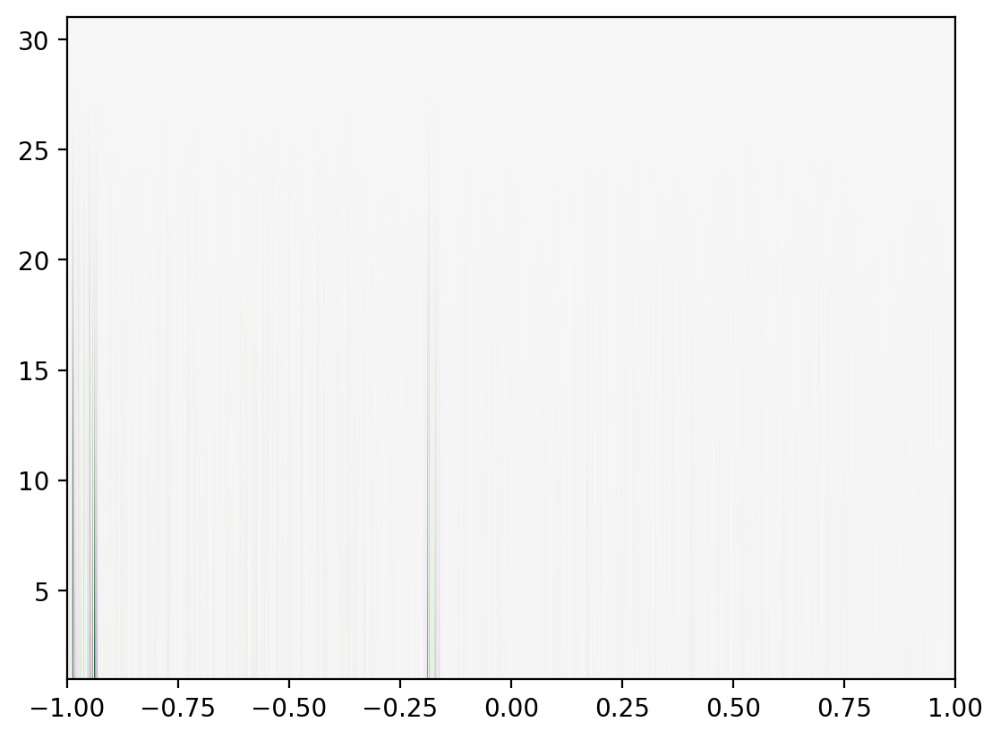

In [20]:
import numpy as np
from scipy.signal import cwt, ricker
import matplotlib.pyplot as plt

# Assuming 'signal' is your time trace signal
signal = ts_binned.as_dataframe['detector_sum'][0:cutoff_pos['detector_sum']]

# Define the wavelet widths to use in the transform
widths = np.arange(1, 31)

# Compute the wavelet transform of the signal
cwtmatr = cwt(signal, ricker, widths)



# Plot the wavelet transform
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

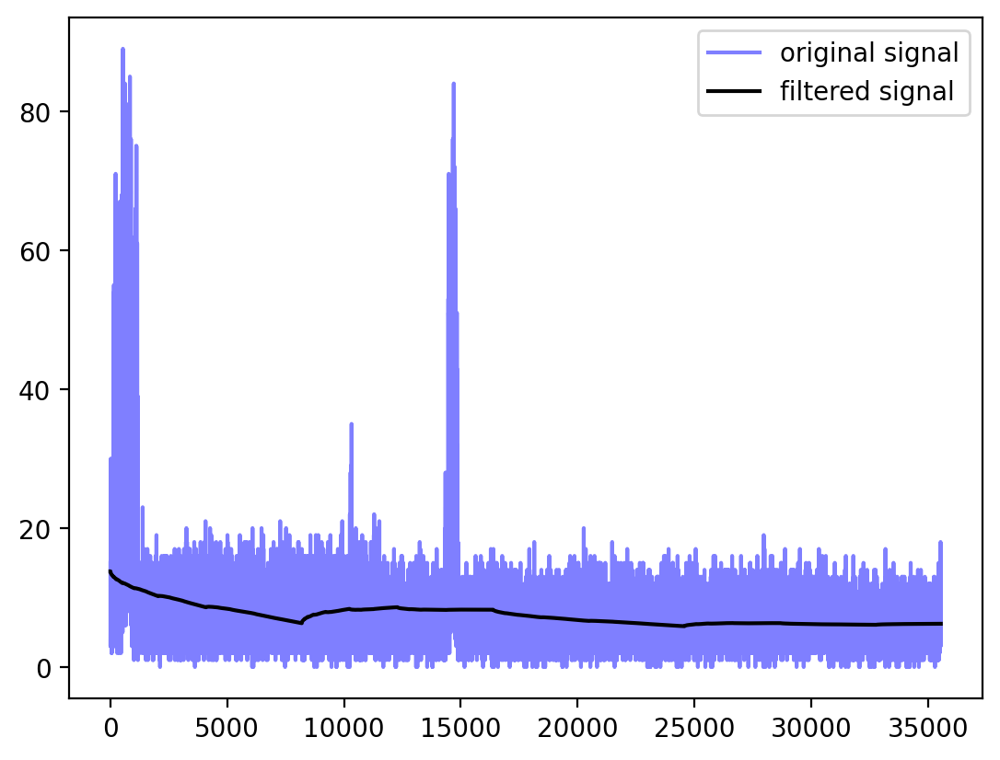

In [28]:
import pywt

# Define the wavelet to use
wavelet = 'db2'

# Compute the wavelet coefficients
coeffs = pywt.wavedec(signal, wavelet)

# Modify the coefficients to filter the signal
# For example, set the detail coefficients to zero to remove high-frequency noise
for i in range(1, len(coeffs)):
    coeffs[i] = np.zeros_like(coeffs[i])


# Compute the inverse wavelet transform
signal_filtered = pywt.waverec(coeffs, wavelet)

# Plot the original and filtered signals
plt.plot(signal, color='b', alpha=0.5, label='original signal')
plt.plot(signal_filtered, color='k', label='filtered signal')
plt.legend()
plt.show()

/opt/homebrew/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


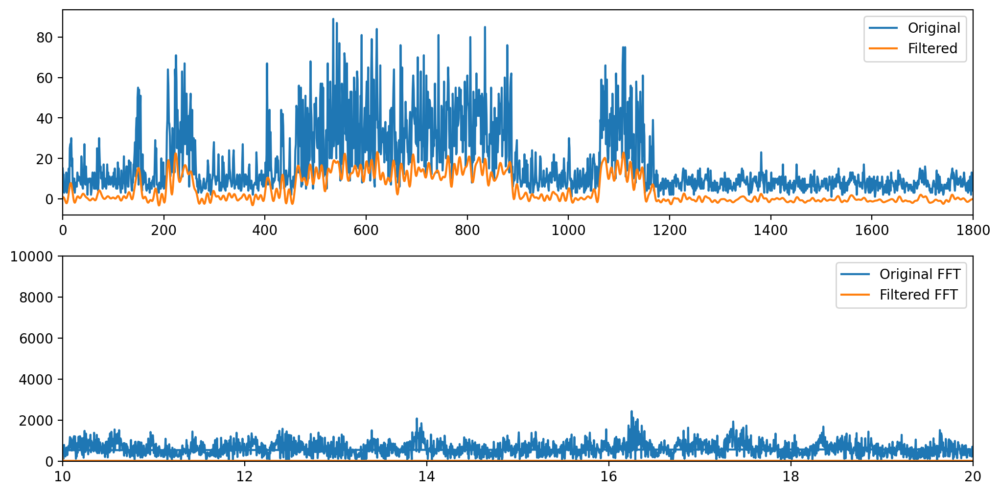

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftfreq

# Assuming 'signal' is your time trace signal and 'T' is the time period
signal = ts_binned.as_dataframe['detector_sum'][:20000]
T = 0.01  # replace with your actual time period

# Compute the FFT of the signal
signal_fft = fft(signal)

# Compute the frequencies associated with the FFT
frequencies = fftfreq(len(signal), T)

# Define the frequency range you want to filter
low_freq, high_freq = 0, 10

# Create a mask for the frequencies you want to keep
mask = (frequencies > low_freq) & (frequencies < high_freq)

# Invert the mask for the frequencies you want to remove
#mask = np.invert(mask)

# Apply the mask to the FFT signal
signal_fft_filtered = signal_fft * mask

# Compute the inverse FFT to get the filtered signal
signal_filtered = ifft(signal_fft_filtered)

# Plot the original and filtered signals
plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.plot(signal, label='Original')
plt.plot(signal_filtered, label='Filtered')
plt.xlim(0, 1800)
plt.legend()

# Plot the original and filtered FFT signals
plt.subplot(212)
plt.plot(frequencies, np.abs(signal_fft), label='Original FFT')
plt.plot(frequencies, np.abs(signal_fft_filtered), label='Filtered FFT')
plt.xlim(10, 20)
plt.ylim(0, 10000)
plt.legend()

plt.show()

/var/folders/2h/6xcys3mx1s7czfj28g_dc70r0000gn/T/ipykernel_14872/1700450714.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  gmms = GMMs(signal_filtered.astype(int), krange=(2, 6))
/var/folders/2h/6xcys3mx1s7czfj28g_dc70r0000gn/T/ipykernel_14872/1700450714.py:10: ComplexWarning: Casting complex values to real discards the imaginary part
  sf = sfHMM1(signal_filtered.astype(int), krange=(2, gmms_opt_n), model='p', name=detector).run_all(plot=True)


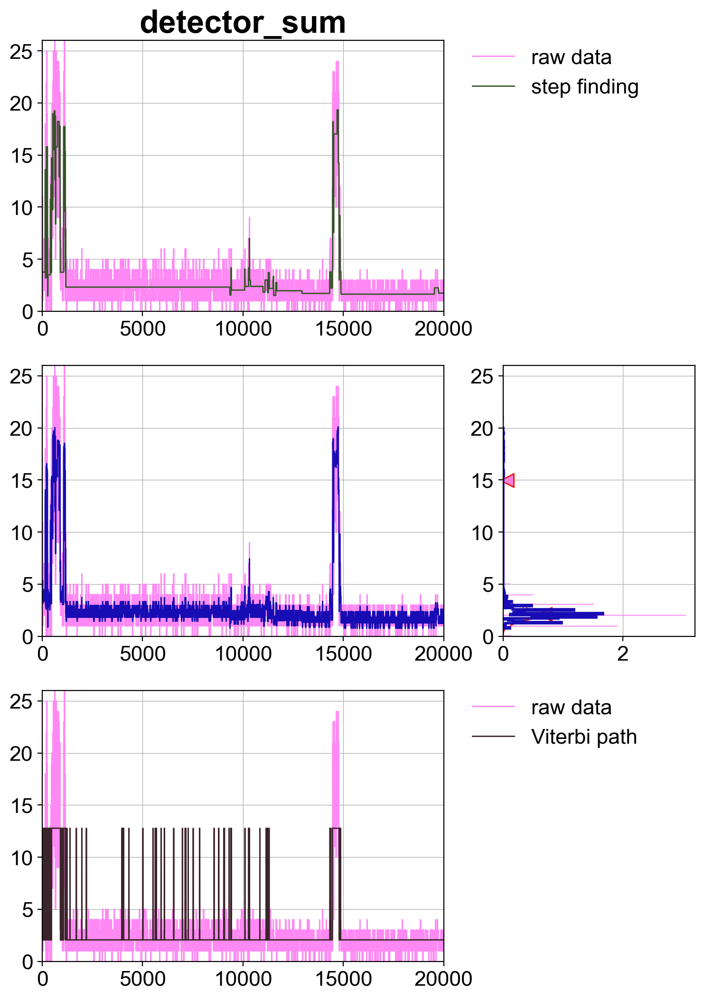

In [10]:
# shift signal to positive values
signal_filtered = signal_filtered - np.min(signal_filtered)


gmms = GMMs(signal_filtered.astype(int), krange=(2, 6))
gmms.fit()
#gmms.show_aic_bic()
#gmms.plot_all()
gmms_opt_n = gmms.get_optimal(criterion="bic").n_components
sf = sfHMM1(signal_filtered.astype(int), krange=(2, gmms_opt_n), model='p', name=detector).run_all(plot=True)
hmma.plot_viterbi(ts_binned, sf)

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import numpy as np

In [12]:

# Simulated noisy signal (replace this with your actual signal)
# Assume 'signal' is your input signal as a 1D array
signal = ts_binned.as_dataframe['detector_sum'][:20000]

# Prepare data for LSTM without binarization
def create_sequences(signal, n_steps):
    X, y = [], []
    for i in range(len(signal)):
        end_ix = i + n_steps
        if end_ix > len(signal)-1:
            break
        seq_x, seq_y = signal[i:end_ix], signal[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

n_steps = 10  # Define the number of time steps for sequences
X, y = create_sequences(signal, n_steps)
X = X.reshape((X.shape[0], X.shape[1], 1))

# Build LSTM model without binarization
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_steps, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Train the LSTM model
model.fit(X, y, epochs=20, verbose=1)

# Make predictions on the signal
predicted_states = model.predict(X)

Epoch 1/20
625/625 [==============================] - 2s 2ms/step - loss: 27.7055
Epoch 2/20
625/625 [==============================] - 1s 2ms/step - loss: 25.1998
Epoch 3/20
625/625 [==============================] - 1s 2ms/step - loss: 24.6684
Epoch 4/20
625/625 [==============================] - 1s 2ms/step - loss: 24.6627
Epoch 5/20
625/625 [==============================] - 1s 2ms/step - loss: 24.5201
Epoch 6/20
625/625 [==============================] - 1s 2ms/step - loss: 24.4525
Epoch 7/20
625/625 [==============================] - 1s 2ms/step - loss: 24.4984
Epoch 8/20
625/625 [==============================] - 1s 2ms/step - loss: 24.2437
Epoch 9/20
625/625 [==============================] - 1s 2ms/step - loss: 24.1897
Epoch 10/20
625/625 [==============================] - 1s 2ms/step - loss: 24.1679
Epoch 11/20
625/625 [==============================] - 1s 2ms/step - loss: 25.9452
Epoch 12/20
625/625 [==============================] - 1s 2ms/step - loss: 25.6400
Epoch 13/20
6

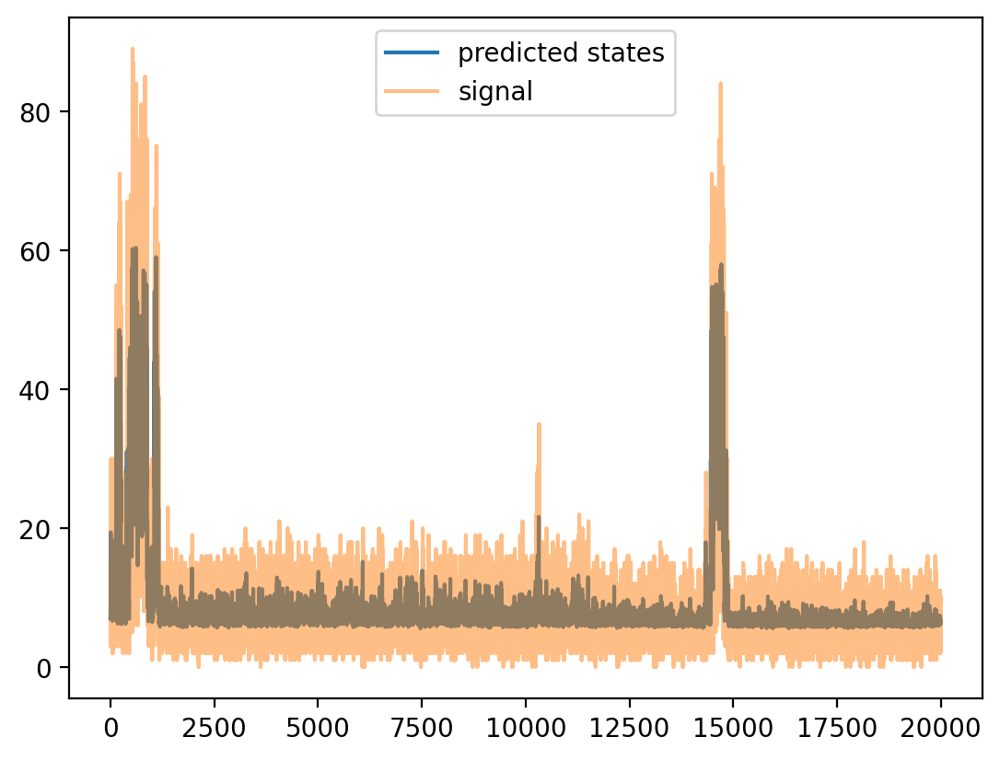

In [13]:
# plot predicted states and signal
plt.plot(predicted_states, label='predicted states')
plt.plot(signal, label='signal', alpha=0.5)
plt.legend()
plt.show()

In [14]:
# create the same plot in bokeh
from bokeh.plotting import figure, show, output_notebook, curdoc
from bokeh.models import ColumnDataSource
from bokeh.layouts import column
from bokeh.models.tools import HoverTool

# Set output style for bokeh plots
curdoc().theme = 'dark_minimal'
output_notebook()

# create a new plot with a title and axis labels
p = figure(title="LSTM prediction", x_axis_label='time', y_axis_label='signal', width=800, height=400)

# add a line renderer with legend and line thickness
p.line(np.arange(len(predicted_states)), predicted_states.flatten(), legend_label="predicted states", line_width=2)
p.line(np.arange(len(signal)), signal, legend_label="signal", line_width=2, alpha=0.5)

# show the results
show(p)

Loading BokehJS ...

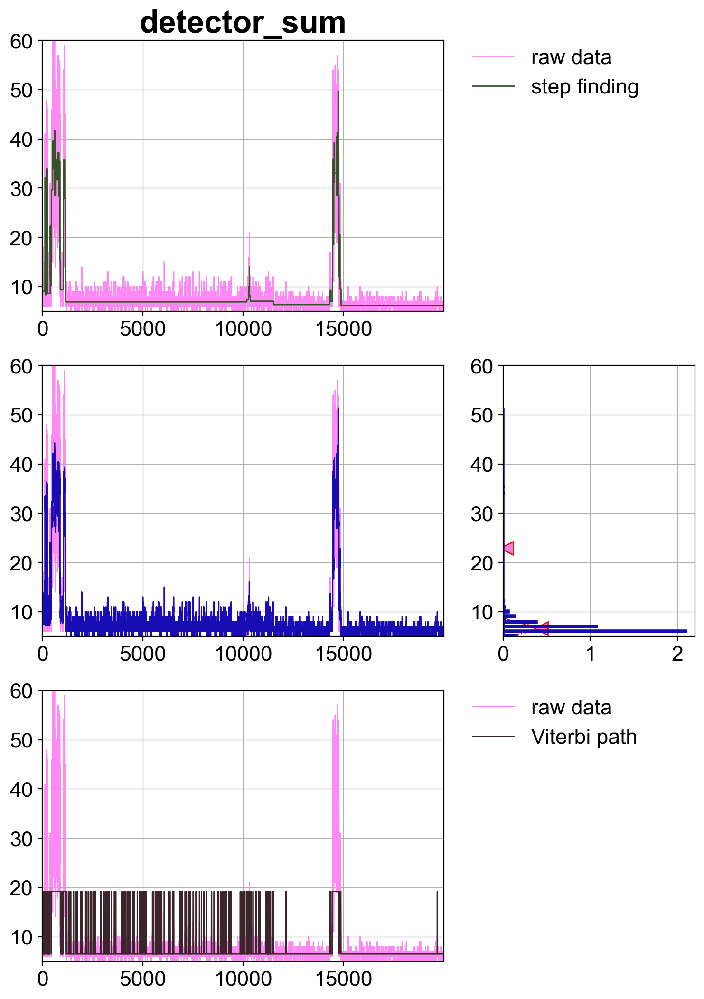

In [15]:
gmms = GMMs(predicted_states.astype(int), krange=(2, 6))
gmms.fit()
#gmms.show_aic_bic()
#gmms.plot_all()
gmms_opt_n = gmms.get_optimal(criterion="bic").n_components
sf = sfHMM1(predicted_states.astype(int), krange=(2, gmms_opt_n), model='p', name=detector).run_all(plot=True)
hmma.plot_viterbi(ts_binned, sf)

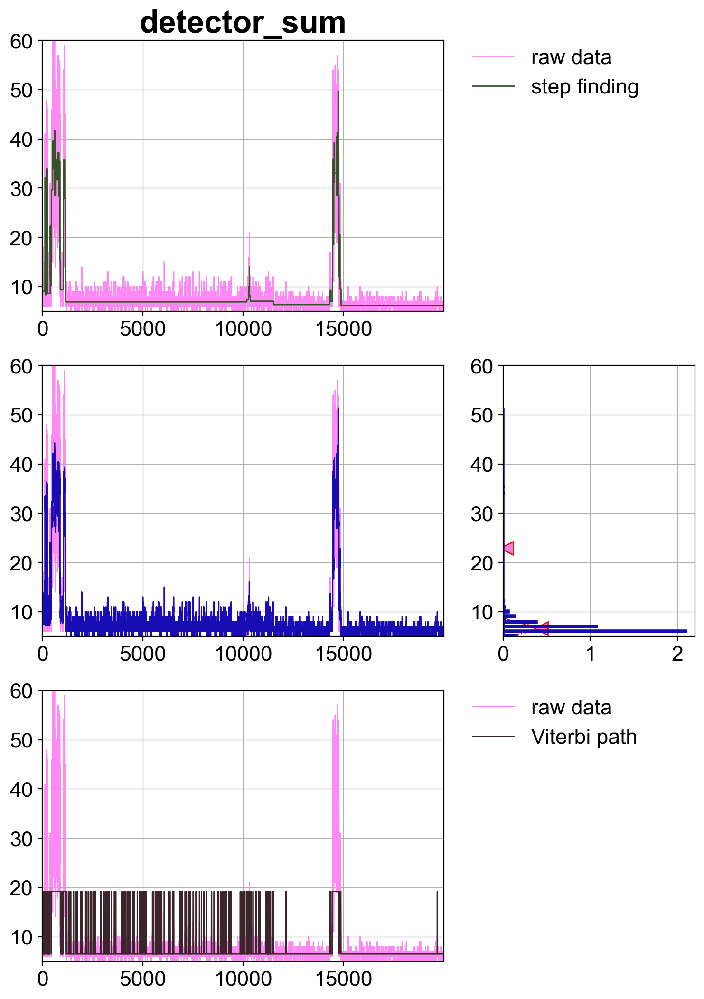

In [16]:
gmms = GMMs(predicted_states.astype(int), krange=(2, 6))
gmms.fit()
#gmms.show_aic_bic()
#gmms.plot_all()
gmms_opt_n = gmms.get_optimal(criterion="bic").n_components
sf = sfHMM1(predicted_states.astype(int), krange=(2, gmms_opt_n), model='p', name=detector).run_all(plot=True)
hmma.plot_viterbi(ts_binned, sf)